<a href="https://colab.research.google.com/github/abhinav4201/yoga-trial/blob/main/worldwide_yoga_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
# Import Essential Libraries
import numpy as np
import pandas as pd

#Importing Data Visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
from scipy.stats import norm

# Datetime library for manipulating Date columns.
from datetime import datetime
import calendar

# The following lines adjust the granularity of reporting.
pd.options.display.float_format = "{:.2f}".format

#Import warnings are issued to alert developers to potential issues with their
#code, and it is important to address these warnings in order to avoid potential problems.
import warnings
warnings.filterwarnings('ignore')

In [11]:
!pip install dtale

In [4]:
import dtale

In [12]:
#here google drive is attached to colab so that files can be accessed easily
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [29]:
# Load Dataset
path = '/content/drive/MyDrive/yoga data/worldwidecsv2.csv'

#using 'pd.read_csv' function to load csv file, it takes a file path or URL as an
#input, and returns a DataFrame that contains the data from the CSV file

yoga_df = pd.read_csv(path)

In [30]:
yoga_df.head()

,Keyword,Avg_monthly_searches,Three_month_change,YoY_change,Competition,Competition_indexed_value_,Low_Bid,High_Bid,Aug_2022,Sep_2022,Oct_2022,Nov_2022,Dec_2022,Jan_2023,Feb_2023,Mar_2023,Apr_2023,May-23,Jun_2023,Jul_2023
0,yoga,22200.00,0,22,Low,14.00,45.03,146.82,18100.00,22200.00,22200.00,22200.00,18100.00,27100.00,22200.00,22200.00,18100.00,18100.00,18100.00,18100.00
1,sadhguru,2900.00,0,-34,Low,2.00,37.05,165.90,3600.00,2900.00,3600.00,2900.00,2900.00,2900.00,2400.00,2900.00,2400.00,1900.00,2400.00,1900.00
2,namaste,3600.00,-19,0,Low,3.00,3.60,48.11,3600.00,3600.00,3600.00,3600.00,3600.00,4400.00,3600.00,4400.00,3600.00,3600.00,2900.00,2900.00
3,surya namaskar,320.00,-19,-19,Low,6.00,NaN,NaN,320.00,320.00,320.00,320.00,260.00,390.00,320.00,390.00,390.00,320.00,390.00,260.00
4,hatha yoga,3600.00,-17,26,Low,11.00,15.40,95.96,2900.00,3600.00,3600.00,3600.00,2400.00,5400.00,3600.00,3600.00,2900.00,2900.00,2900.00,2400.00


In [31]:
yoga_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 740 entries, 0 to 739
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Keyword                     740 non-null    object 
 1   Avg_monthly_searches        733 non-null    float64
 2   Three_month_change          740 non-null    object 
 3   YoY_change                  740 non-null    object 
 4   Competition                 740 non-null    object 
 5   Competition_indexed_value_  651 non-null    float64
 6   Low_Bid                     161 non-null    float64
 7   High_Bid                    161 non-null    float64
 8   Aug_2022                    733 non-null    float64
 9   Sep_2022                    733 non-null    float64
 10  Oct_2022                    733 non-null    float64
 11  Nov_2022                    733 non-null    float64
 12  Dec_2022                    733 non-null    float64
 13  Jan_2023                    733 non

In [32]:

# Dataset Duplicate Value Count
# yoga_df.duplicated().value_counts()
len(yoga_df[yoga_df.duplicated()])

0

In [33]:
#this will return column with atleast one null value
yoga_df.loc[:,yoga_df.isna().sum()!=0][:5]

,Avg_monthly_searches,Competition_indexed_value_,Low_Bid,High_Bid,Aug_2022,Sep_2022,Oct_2022,Nov_2022,Dec_2022,Jan_2023,Feb_2023,Mar_2023,Apr_2023,May-23,Jun_2023,Jul_2023
0,22200.00,14.00,45.03,146.82,18100.00,22200.00,22200.00,22200.00,18100.00,27100.00,22200.00,22200.00,18100.00,18100.00,18100.00,18100.00
1,2900.00,2.00,37.05,165.90,3600.00,2900.00,3600.00,2900.00,2900.00,2900.00,2400.00,2900.00,2400.00,1900.00,2400.00,1900.00
2,3600.00,3.00,3.60,48.11,3600.00,3600.00,3600.00,3600.00,3600.00,4400.00,3600.00,4400.00,3600.00,3600.00,2900.00,2900.00
3,320.00,6.00,NaN,NaN,320.00,320.00,320.00,320.00,260.00,390.00,320.00,390.00,390.00,320.00,390.00,260.00
4,3600.00,11.00,15.40,95.96,2900.00,3600.00,3600.00,3600.00,2400.00,5400.00,3600.00,3600.00,2900.00,2900.00,2900.00,2400.00


In [34]:
yoga_df.isnull().sum()

Keyword                         0
Avg_monthly_searches            7
Three_month_change              0
YoY_change                      0
Competition                     0
Competition_indexed_value_     89
Low_Bid                       579
High_Bid                      579
Aug_2022                        7
Sep_2022                        7
Oct_2022                        7
Nov_2022                        7
Dec_2022                        7
Jan_2023                        7
Feb_2023                        7
Mar_2023                        7
Apr_2023                        7
May-23                          7
Jun_2023                        7
Jul_2023                        7
dtype: int64

In [35]:
df = yoga_df.copy()

In [36]:
# Define a mapping from string to integer
mapping = {'Low': 1, 'Medium': 2, 'High': 3, 'Unknown': 0}

# Map the values in the DataFrame
df['Competition'] = df['Competition'].map(mapping)

In [37]:
# Dataset Columns
print(f'Features : {df.columns.to_list()}')


Features : ['Keyword', 'Avg_monthly_searches', 'Three_month_change', 'YoY_change', 'Competition', 'Competition_indexed_value_', 'Low_Bid', 'High_Bid', 'Aug_2022', 'Sep_2022', 'Oct_2022', 'Nov_2022', 'Dec_2022', 'Jan_2023', 'Feb_2023', 'Mar_2023', 'Apr_2023', 'May-23', 'Jun_2023', 'Jul_2023']


In [ ]:
!pip install autoviz

In [39]:
%matplotlib inline

Shape of your Data Set loaded: (740, 20)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    20 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Keyword']
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Keyword,object,0.000000,100,nan,nan,"Possible ID colum: drop before modeling process., 740 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 740 unique values: Use hash encoding or embedding to reduce dimension."
Avg_monthly_searches,float64,0.945946,NA,0.000000,22200.000000,"7 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 95 outliers greater than upper bound (110.00) or lower than lower bound(-50.00). Cap them or remove them."
Three_month_change,object,0.000000,7,nan,nan,41 rare categories: Too many to list. Group them into a single category or drop the categories.
YoY_change,object,0.000000,8,nan,nan,50 rare categories: Too many to list. Group them into a single category or drop the categories.
Competition,object,0.000000,0,nan,nan,No issue
Competition_indexed_value_,float64,12.027027,NA,0.000000,100.000000,"89 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 93 outliers greater than upper bound (43.75) or lower than lower bound(-26.25). Cap them or remove them."
Low_Bid,float64,78.243243,NA,2.790000,340.910000,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 10 outliers greater than upper bound (112.03) or lower than lower bound(-38.21). Cap them or remove them."
High_Bid,float64,78.243243,NA,6.330000,3604.480000,"579 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 11 outliers greater than upper bound (411.72) or lower than lower bound(-93.40). Cap them or remove them."
Aug_2022,float64,0.945946,NA,0.000000,18100.000000,"7 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 91 outliers greater than upper bound (110.00) or lower than lower bound(-50.00). Cap them or remove them., has a high correlation with ['Avg_monthly_searches']. Consider dropping one of them."
Sep_2022,float64,0.945946,NA,0.000000,22200.000000,"7 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 90 outliers greater than upper bound (110.00) or lower than lower bound(-50.00). Cap them or remove them., has a high correlation with ['Avg_monthly_searches', 'Aug_2022']. Consider dropping one of them."


Number of All Scatter Plots = 136


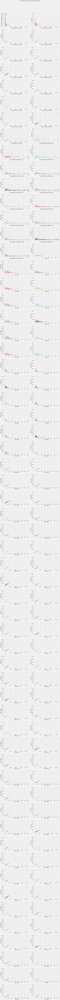

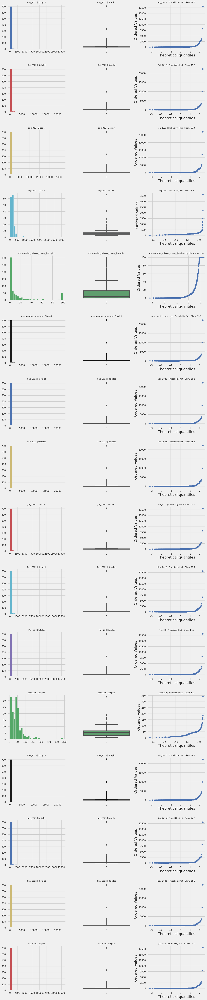

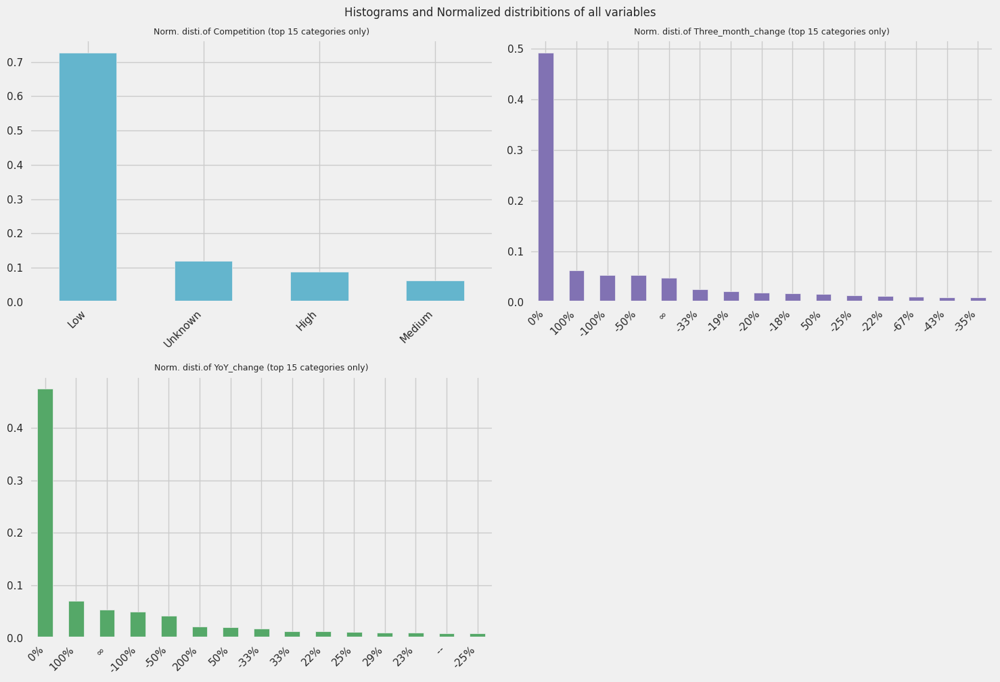

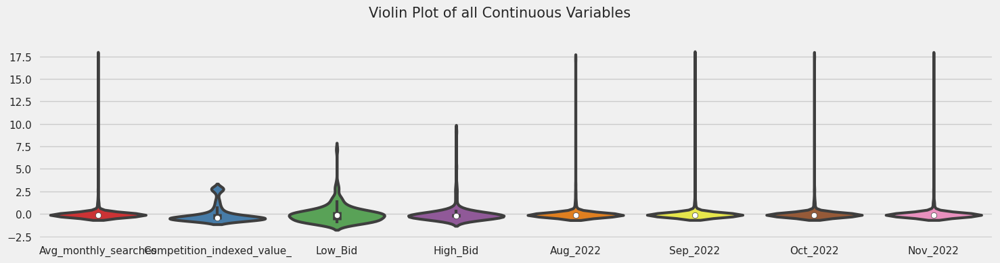

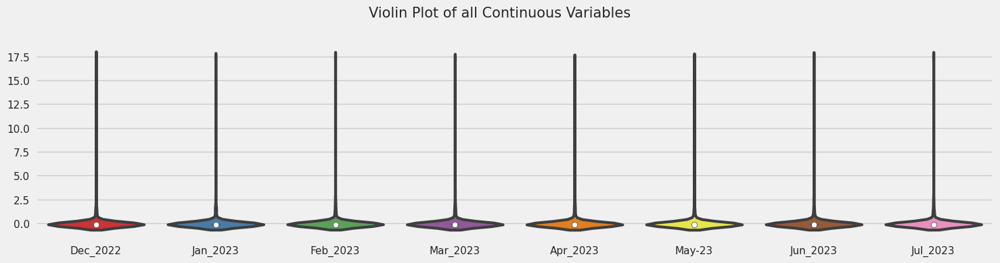

...

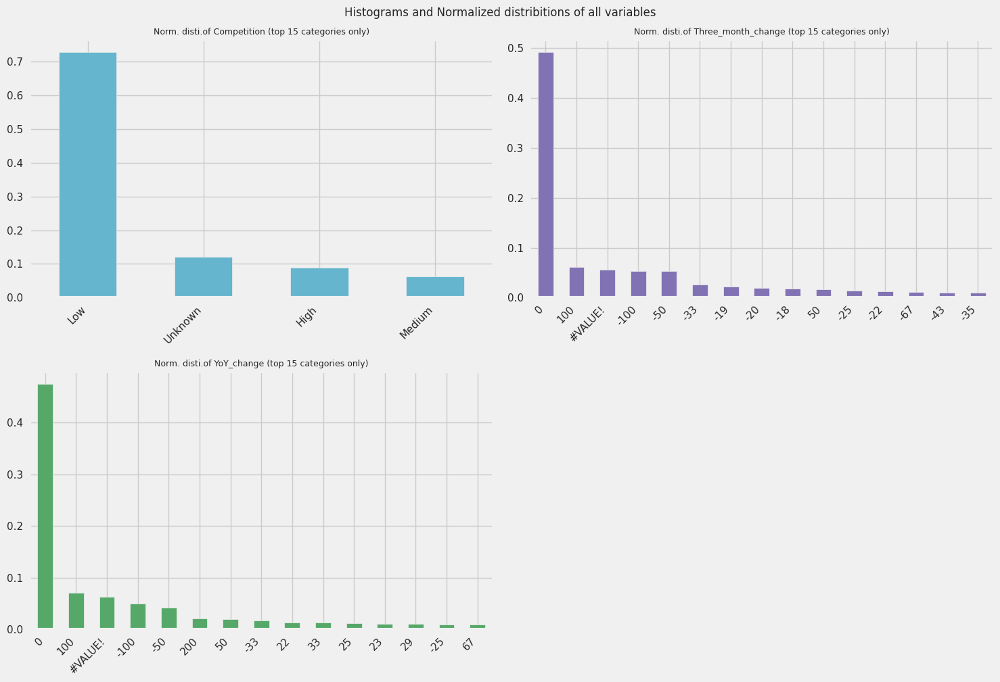

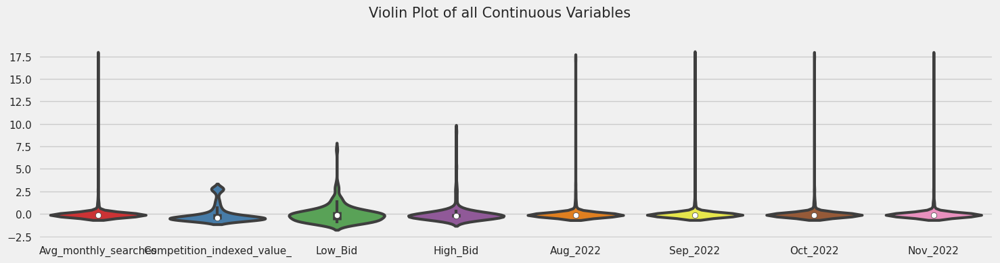

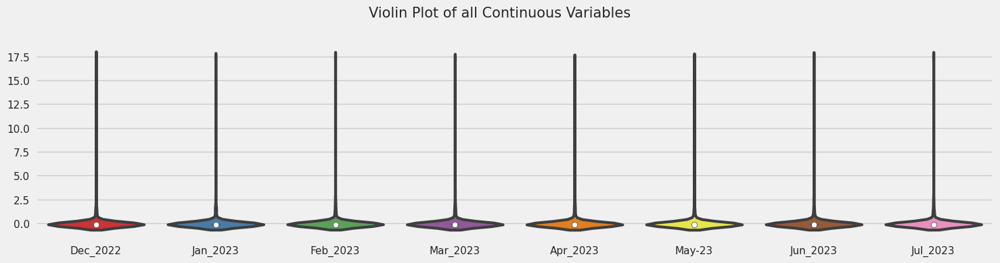

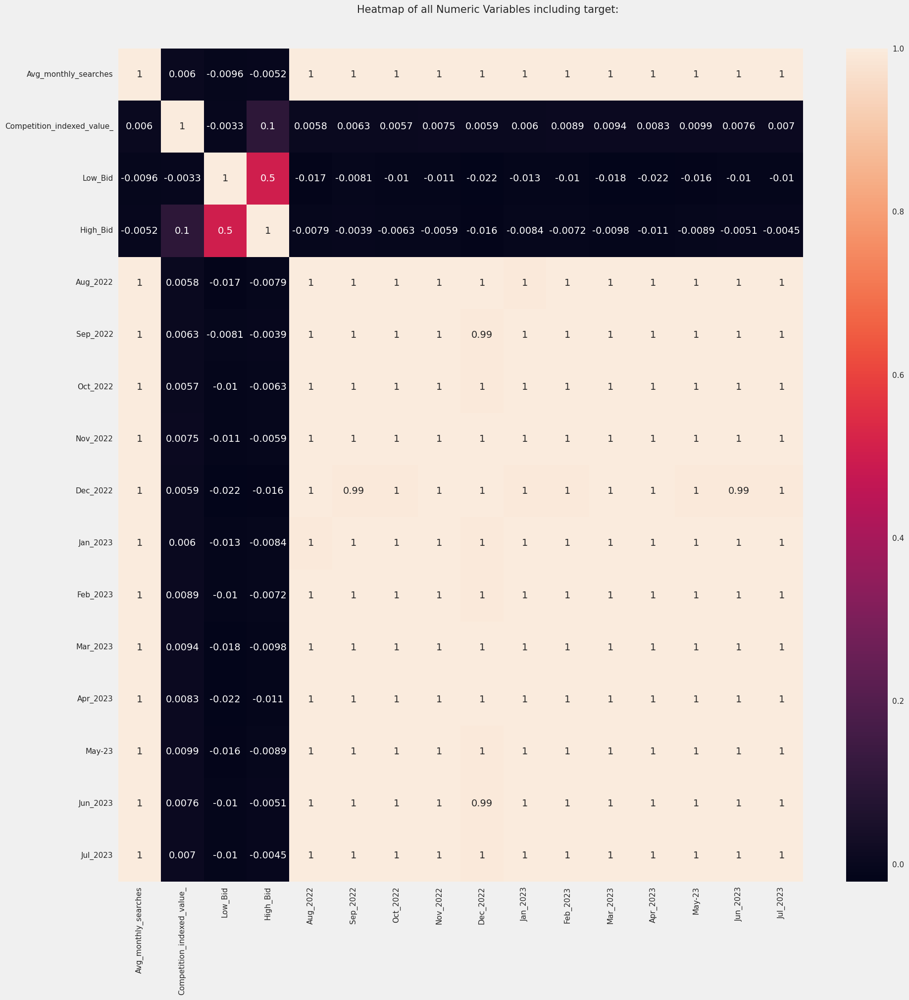

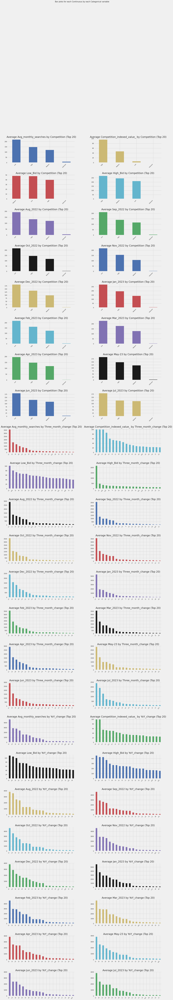

All Plots done
Time to run AutoViz = 90 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Keyword,Avg_monthly_searches,Three_month_change,YoY_change,Competition,Competition_indexed_value_,Low_Bid,High_Bid,Aug_2022,Sep_2022,Oct_2022,Nov_2022,Dec_2022,Jan_2023,Feb_2023,Mar_2023,Apr_2023,May-23,Jun_2023,Jul_2023
0,yoga,22200.00,0,22,Low,14.00,45.03,146.82,18100.00,22200.00,22200.00,22200.00,18100.00,27100.00,22200.00,22200.00,18100.00,18100.00,18100.00,18100.00
1,sadhguru,2900.00,0,-34,Low,2.00,37.05,165.90,3600.00,2900.00,3600.00,2900.00,2900.00,2900.00,2400.00,2900.00,2400.00,1900.00,2400.00,1900.00
2,namaste,3600.00,-19,0,Low,3.00,3.60,48.11,3600.00,3600.00,3600.00,3600.00,3600.00,4400.00,3600.00,4400.00,3600.00,3600.00,2900.00,2900.00
3,surya namaskar,320.00,-19,-19,Low,6.00,NaN,NaN,320.00,320.00,320.00,320.00,260.00,390.00,320.00,390.00,390.00,320.00,390.00,260.00
4,hatha yoga,3600.00,-17,26,Low,11.00,15.40,95.96,2900.00,3600.00,3600.00,3600.00,2400.00,5400.00,3600.00,3600.00,2900.00,2900.00,2900.00,2400.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
735,isha centre,10.00,0,0,Low,4.00,NaN,NaN,20.00,10.00,10.00,10.00,10.00,10.00,20.00,10.00,10.00,10.00,10.00,10.00
736,odaka yoga,10.00,0,0,Low,0.00,NaN,NaN,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,10.00,20.00,10.00
737,bridge yoga,30.00,0,50,Low,1.00,NaN,NaN,40.00,20.00,30.00,20.00,30.00,20.00,20.00,20.00,30.00,30.00,30.00,30.00
738,sun salutation steps,10.00,#VALUE!,#VALUE!,Low,0.00,NaN,NaN,10.00,10.00,10.00,10.00,0.00,10.00,10.00,0.00,10.00,0.00,10.00,10.00


In [40]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
tf = AV.AutoViz(path)
tf